# Analyzing prevalent COVID-19 datasets to generate insights on the spread of COVID-19 over time using charts, graphs, time series and other tools.

### Thanya Ramanathan and Anirudh Balan
---

In [1]:
# Importing the libraries

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
# Reading the datasets

In [4]:
df1 = pd.read_csv('/Users/test/Desktop/Project/basic/covid_19_india.csv')
df2 = pd.read_csv('/Users/test/Desktop/Project/basic/archive/covid_19_data.csv')
df3 = pd.read_csv('/Users/test/Desktop/Project/response_graphs_data_2021-01-14.csv')
df4 = pd.read_csv('/Users/test/Desktop/Project/H1N1/data.csv')
df5 = pd.read_csv('/Users/test/Desktop/Project/SARS/sars_2003_complete_dataset_clean.csv')
df6 = pd.read_csv('/Users/test/Desktop/Project/daily-covid-vaccination-doses-per-capita.csv')
df8 = pd.read_csv('/Users/test/Desktop/Project/covid-vaccine-doses-by-manufacturer.csv')

---

### Plotting the most common measures taken by different countries to prevent the spread of COVID-19

In [5]:
#using groupby() method to get all the uniques response measures and all their respective values

In [6]:
df7 = pd.DataFrame(df3.groupby('Response_measure'))

In [7]:
df7.drop(columns = [1], inplace = True)

In [8]:
df7.rename(columns = {0 : 'ResponseMeasure'}, inplace = True)

In [9]:
response_count = dict(df3['Response_measure'].value_counts())

In [10]:
import collections
response_count = collections.OrderedDict(sorted(response_count.items()))

In [11]:
counts = response_count.values()

In [12]:
# Creating a new dataframe df7 that has the response measures and the number countries that have taken that measure

In [13]:
df7['Counts'] = counts

In [14]:
# defining a function to plot big set of data

Text(0, 0.5, 'Response Measure')

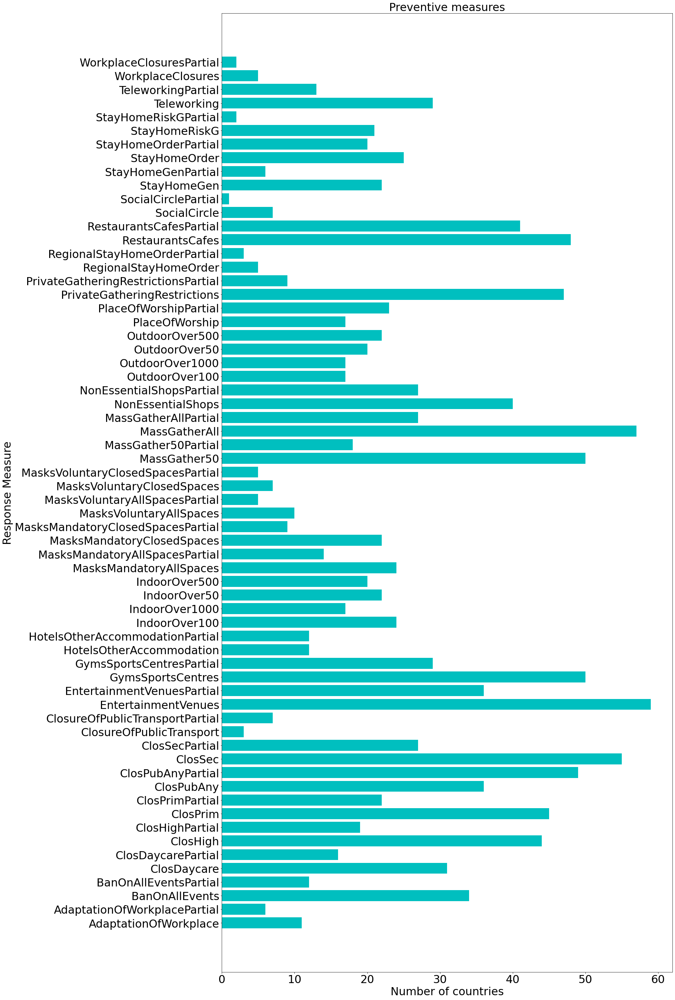

In [15]:
plt.figure(figsize=(22, 48))
plt.barh(df7['ResponseMeasure'],df7['Counts'], color ='c')
plt.title('Preventive measures', size=30)
plt.xticks(size=30)
plt.yticks(size=30)
plt.xlabel('Number of countries', size = 30)
plt.ylabel('Response Measure', size = 30)

#### The above graph displays the number of countries that have adpoted a specific method to prevent the spread of COVID-19. Closing entertainment venues is the most preferred response measure.

---

### COVID-19 in India

In [16]:
df1['Date'] = pd.to_datetime(df1['Date'] , format = '%d/%m/%y')

In [17]:
# Plotting the number of confirmed cases, cured patients and deaths in each state/union territory as of 09/12/2020

In [18]:
filt = df1['State/UnionTerritory'].unique()
x = df1.groupby(['State/UnionTerritory'])    
Confirmed_cases = list()
cured_cases = list()
deaths = list()
for state in filt:
    df11 = pd.DataFrame(x.get_group(state))
    Confirmed_cases.append(df11['Confirmed'].sum())
    cured_cases.append(df11['Cured'].sum())
    deaths.append(df11['Deaths'].sum())

In [19]:
#creating a dataframe that contains the total number of confirmed cases, cured cases and deaths of each state as of 09/12/2020

In [20]:
df12 = pd.DataFrame(filt)

In [21]:
df12['Totalconfirmedcases'] = Confirmed_cases
df12['Totalcuredcases'] = cured_cases
df12['Totaldeaths'] = deaths

In [22]:
df12.rename(columns = {0 : 'State/UnionTerritory'}, inplace = True)

In [23]:
# Plotting a line graph

In [24]:
plt.figure(figsize=(550, 100))
plt.title('NUMBER OF CASES IN STATES', size = 300, fontweight = 'bold')
plt.xticks(size=250, rotation = 30)
plt.yticks(size=250)
plt.plot(df12['State/UnionTerritory'], df12['Totalconfirmedcases'], 'g',label = 'Confirmed Cases', linewidth = 35)
plt.plot(df12['State/UnionTerritory'], df12['Totalcuredcases'],'r',label = 'Cured Cases',linewidth = 35)
plt.plot(df12['State/UnionTerritory'], df12['Totaldeaths'],'c',label = 'Deaths',linewidth = 35, linestyle = '-.')
plt.xlabel('State/Union Territory', size = 300)
plt.ylabel('Number of cases', size = 300)
plt.legend(prop={'size': 250})

#### We can infer from the above graph that the most number of confirmed cases can be seen in Maharashtra, Tamil Nadu and Karnataka as o 09/12/2020.

In [25]:
# Plotting the number of confirmed cases with respect to the date

In [26]:
df1.set_index('Date', inplace = True)

In [27]:
Y = df1.resample('D').agg({'Cured':'sum', 'Deaths':'sum', 'Confirmed':'sum'})

In [28]:
Y1 = Y.reset_index()

In [101]:
# Plotting the time series

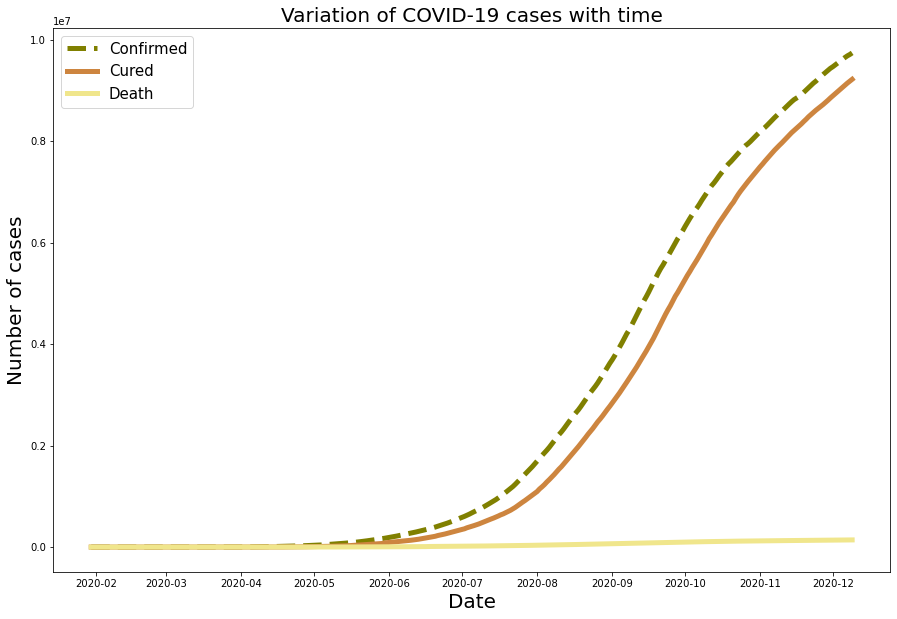

In [29]:
plt.figure(figsize = (15,10))
plt.title('Variation of COVID-19 cases with time', size = 20)

plt.plot_date(Y1['Date'],Y1['Confirmed'],'olive', label = 'Confirmed',linestyle = '--', linewidth = 5)
plt.plot_date(Y1['Date'],Y1['Cured'],'peru', label = 'Cured', linestyle = 'solid', linewidth = 5)
plt.plot_date(Y1['Date'],Y1['Deaths'],'Khaki', label = 'Death', linestyle = '-', linewidth = 5)

plt.xlabel('Date', size = 20)
plt.ylabel('Number of cases', size = 20)
plt.legend(prop={'size': 15})

#### The number of cases see a steep rise from June 2020 as per the above line graph

---

### Worldwide COVID-19 data

In [30]:
df2.drop(columns = ['Province/State', 'Last Update'], inplace = True)

In [31]:
df2['ObservationDate'] = pd.to_datetime(df2['ObservationDate'] , format = '%m/%d/%Y')

In [32]:
# Plotting the number of confirmed cases, cured patients and deaths in each country as of 19/01/2021

In [33]:
fil = df2['Country/Region'].unique()
r = df2.groupby(['Country/Region'])    
confirmed = list()
recovered = list()
death = list()
for country in fil:
    df21 = pd.DataFrame(r.get_group(country))
    confirmed.append(df21['Confirmed'].sum())
    recovered.append(df21['Recovered'].sum())
    death.append(df21['Deaths'].sum())

In [34]:
# Creating a dataframe that contains the total number of confirmed cases, cured cases and deaths of each state as of 19/01/2021

In [35]:
df22 = pd.DataFrame(fil)

In [36]:
df22['Confirmed'] = confirmed
df22['Recovered'] = recovered
df22['Deaths'] = death

In [37]:
df22.rename(columns = {0 : 'Country/Region'}, inplace = True)

In [38]:
df22 = df22.sort_values(by = ['Confirmed','Recovered','Deaths'], ascending = False).head(10)

In [39]:
# Plotting a line graph

In [40]:
plt.figure(figsize=(500, 100))
plt.title('MOST AFFECTED COUNTRIES', size = 300, fontweight = 'bold')
plt.xticks(size=250, rotation = 30)
plt.yticks(size=250)
plt.plot(df22['Country/Region'], df22['Confirmed'], 'darkblue',label = 'Confirmed', linewidth = 35, linestyle = '-.')
plt.plot(df22['Country/Region'], df22['Recovered'],'r',label = 'Recovered',linewidth = 35)
plt.plot(df22['Country/Region'], df22['Deaths'],'c',label = 'Deaths',linewidth = 35)
plt.xlabel('Country/Region', size = 250)
plt.ylabel('Number of cases', size = 250)
plt.legend(prop={'size': 250})

#### We can infer from the line graph that United States and India have had the most number of COVID-19 cases

In [41]:
# Plotting the number of confirmed cases with respect to the date

In [42]:
df2.set_index('ObservationDate', inplace = True)

In [43]:
X = df2.resample('W').agg({'Recovered':'sum', 'Deaths':'sum', 'Confirmed':'sum'})

In [44]:
X1 = X.reset_index()

In [102]:
# Plotting the time series

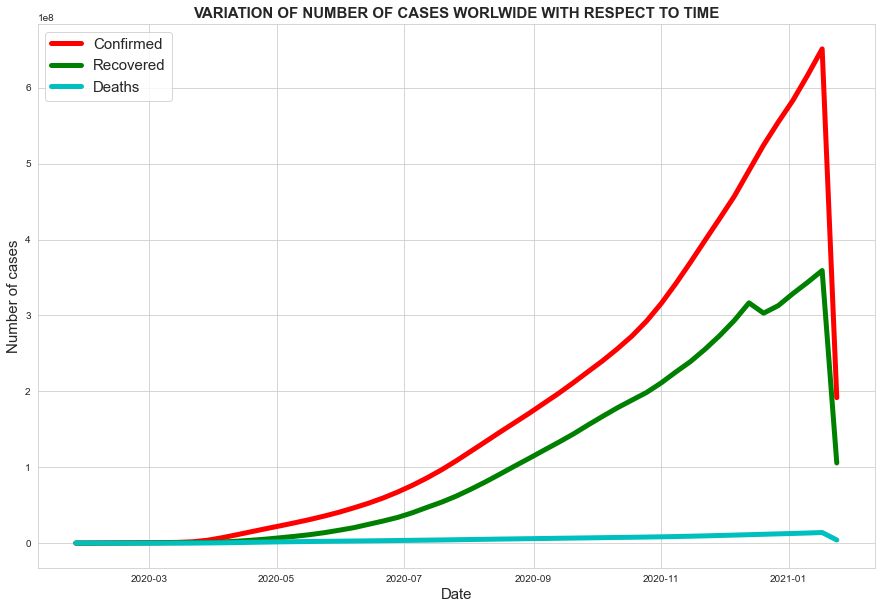

In [45]:
sns.set_style("whitegrid")
plt.figure(figsize = (15,10))
plt.title('VARIATION OF NUMBER OF CASES WORLWIDE WITH RESPECT TO TIME', size = 15, fontweight = 'bold')
plt.plot_date(X1['ObservationDate'],X1['Confirmed'],'r', label = 'Confirmed',linestyle = 'solid', linewidth = 5)
plt.plot_date(X1['ObservationDate'],X1['Recovered'],'g', label = 'Recovered', linestyle = 'solid', linewidth = 5)
plt.plot_date(X1['ObservationDate'],X1['Deaths'],'c', label = 'Deaths', linestyle = '-', linewidth = 5)

plt.xlabel('Date', size = 15)
plt.ylabel('Number of cases', size = 15)
plt.legend(prop = {'size': 15})

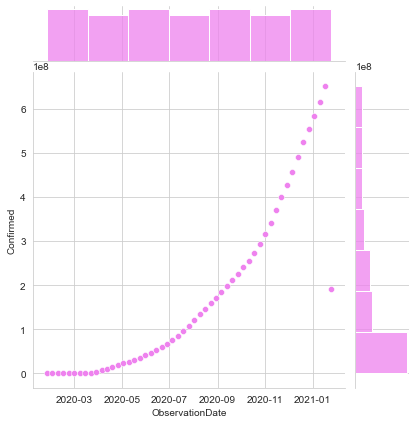

In [46]:
sns.jointplot(data = X1, x = "ObservationDate", y = "Confirmed", color = "violet")

#### There has been a major drop in the number of cases after January 2021 as per the above representation of the data

---

### Comparison with other pandemics

In [47]:
df4.drop(columns = ['Link'], inplace = True)

In [103]:
# Comparing the impact of H1N1, SARS and COVID-19

In [48]:
x = df4.groupby('Country')
y = x.max()
y.sort_values(by = 'Cumulative no. of cases', ascending = False, inplace=True)

In [49]:
q = df5.groupby('Country')
e = q.max()
e.sort_values(by = 'Cumulative number of case(s)', ascending = False, inplace=True)

In [104]:
# Organising the datasets

In [50]:
df4['Date'] = pd.to_datetime(df4['Date'] , format = ('%Y/%m/%d'))
df4.set_index('Date', inplace = True)

In [51]:
t = df4.resample('M').agg({'Cumulative no. of cases':'sum', 'Cumulative no. of deaths':'sum'})

In [52]:
df5['Date'] = pd.to_datetime(df5['Date'] , format = ('%Y/%m/%d'))
df5.set_index('Date', inplace = True)

In [53]:
klk = df5.resample('M').agg({'Cumulative number of case(s)':'sum', 'Number of deaths':'sum'})

In [54]:
sars  = klk.reset_index()

In [55]:
h1n1 = t.reset_index()

In [56]:
Z = df2.resample('D').agg({'Recovered':'sum', 'Deaths':'sum', 'Confirmed':'sum'})

In [57]:
Z.resample('M').agg({'Recovered':'sum', 'Deaths':'sum', 'Confirmed':'sum'})
covid = Z.reset_index()

In [105]:
# Plotting the graph

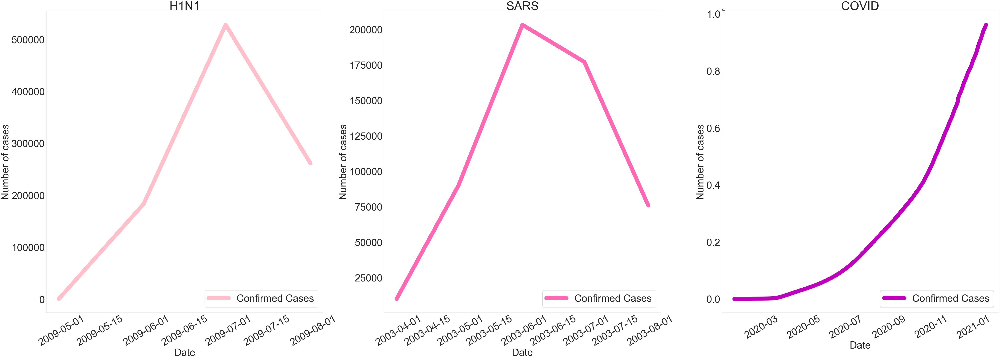

In [58]:
sns.set_style("whitegrid")
plt.figure(figsize=(70, 25))

plt.subplot(131)
plt.title('H1N1', size = 60)
plt.xticks(size=50, rotation = 30)
plt.yticks(size=50)
plt.xlabel('Date', size = 50)
plt.ylabel('Number of cases', size = 50)
plt.tight_layout()
plt.grid(color = 'w')
plt.plot(h1n1['Date'], h1n1['Cumulative no. of cases'], 'pink',label = 'Confirmed Cases', linewidth = 20)
plt.legend(prop={'size': 50}, loc = 'lower right')



plt.subplot(132)
plt.xticks(size=50, rotation = 30)
plt.yticks(size=50)
plt.title('SARS', size = 60)
plt.xlabel('Date', size = 50)
plt.ylabel('Number of cases', size = 50)
plt.tight_layout()
plt.grid(color = 'w')
plt.plot(sars['Date'], sars['Cumulative number of case(s)'], 'hotpink',label = 'Confirmed Cases', linewidth = 20)
plt.legend(prop={'size': 50}, loc = 'lower right')


plt.subplot(133)
plt.xticks(size=50, rotation = 30)
plt.yticks(size=50)
plt.xlabel('Date', size = 50)
plt.ylabel('Number of cases', size = 50)
plt.title('COVID', size = 60)
plt.tight_layout()
plt.grid(color = 'w')
plt.plot(covid['ObservationDate'], covid['Confirmed'], 'm',label = 'Confirmed Cases', linewidth = 20)
plt.legend(prop={'size': 50}, loc = 'lower right')

#### The above graphs show the variation of different pandemics with time. While H1N1 and SARS show a decline in the number of cases after the first 3-4 months COVID-19 have been continuously increasing.

---

### World COVID-19 vaccination

In [59]:
df6['Date'] = pd.to_datetime(df6['Date'] , format = '%Y-%m-%d')

In [60]:
# Creating a dataframe that contains the total number of vaccines in some contries as of 9/02/2021

In [61]:
filtr = df6['Entity'].unique()
A = df6.groupby(['Entity'])    
totalvaccines = list()
for c in filtr:
    df61 = pd.DataFrame(A.get_group(c))
    totalvaccines.append(df61['new_vaccinations_smoothed_per_million'].sum())

In [62]:
df62 = pd.DataFrame(filtr)

In [63]:
df62['Total no. of vaccines administered'] = totalvaccines

In [64]:
df62.rename(columns = {0:'Entity'}, inplace = True)

In [106]:
# Plotting a bar graph to show the number of vaccines administered by different countries

Text(0.5, 0, 'Number of vaccines administered')

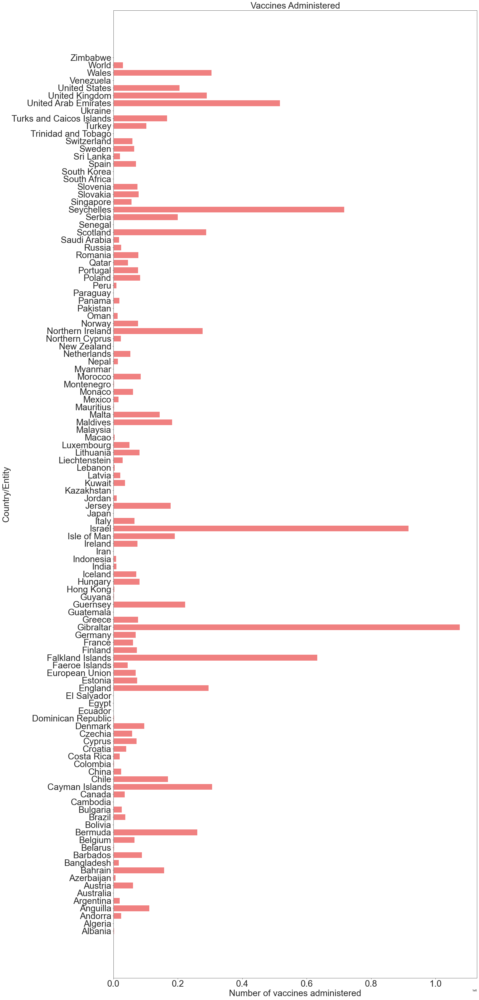

In [65]:
sns.set_style("ticks")
plt.figure(figsize=(22, 60))
plt.barh(df62['Entity'],df62['Total no. of vaccines administered'], color ='lightcoral')
plt.title('Vaccines Administered', size=30)
plt.xticks(size=30)
plt.yticks(size=30)

plt.ylabel('Country/Entity', size = 30)
plt.xlabel('Number of vaccines administered', size = 30)

#### Gibraltar has the most number of people vaccinated per capita.

In [66]:
# Plotting the number of vaccines administered with respect to the date

In [67]:
df6.set_index('Date', inplace = True)

In [68]:
Z = df6.resample('D').agg({'new_vaccinations_smoothed_per_million':'sum'})

In [69]:
Z1 = Z.reset_index()

In [107]:
# Plotting the time series

Text(0, 0.5, 'Number of vaccines administered')

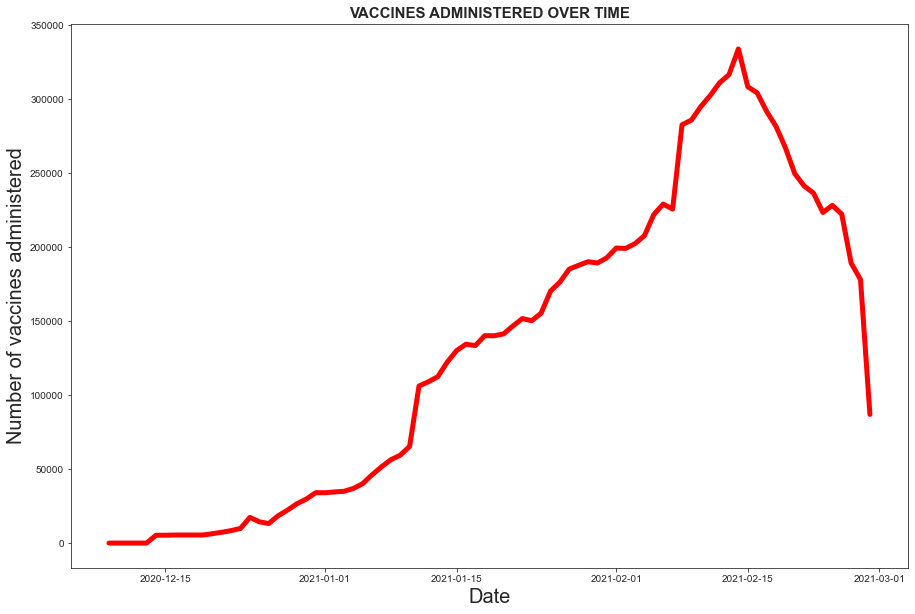

In [70]:
sns.set_style("ticks")
plt.figure(figsize = (15,10))
plt.title('VACCINES ADMINISTERED OVER TIME', size = 15, fontweight = 'bold')
plt.plot_date(Z1['Date'],Z1['new_vaccinations_smoothed_per_million'],'r', linestyle = '-', linewidth = 5)

plt.xlabel('Date', size = 20)
plt.ylabel('Number of vaccines administered', size = 20)

#### The number of vaccines administered have been rising since December 2020 but the graph shows steep drop after the first week of February 2021

In [108]:
# Plotting the different vaccines used in countries

In [72]:
vaccinefil = df8['Entity'].unique()
V = df8.groupby(['Entity'])    
moderna = list()
Oxford_AstraZeneca = list()
Pfizer_BioNTech = list()
Sinovac = list()

for entity in vaccinefil:
    df81 = pd.DataFrame(V.get_group(entity))
    moderna.append(df81['Moderna'].sum())
    Oxford_AstraZeneca.append(df81['Oxford/AstraZeneca'].sum())
    Pfizer_BioNTech.append(df81['Pfizer/BioNTech'].sum())
    Sinovac.append(df81['Sinovac'].sum())

In [73]:
df82 = pd.DataFrame(vaccinefil)

In [74]:
df82['Moderna'] = moderna
df82['Oxford/AstraZeneca'] = Oxford_AstraZeneca
df82['Pfizer/BioNTech'] = Pfizer_BioNTech
df82['Sinovac'] = Sinovac

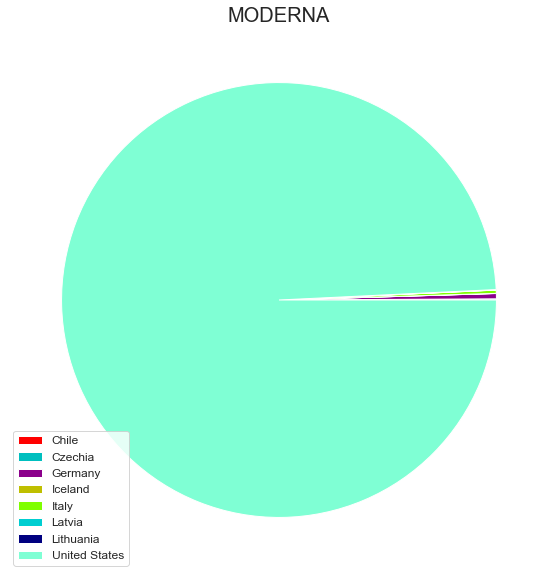

In [75]:
sns.set_style("whitegrid")
clr1 = ['r','c','darkmagenta','y','chartreuse','darkturquoise','navy','aquamarine']
plt.figure(figsize = (10,10))
plt.title('MODERNA',size = 20)
plt.pie(df82['Moderna'], colors = clr1)
plt.legend(labels = df82[0], loc = 3, prop = {'size': 12})

#### United States of America is the highest consumer of Moderna vaccine

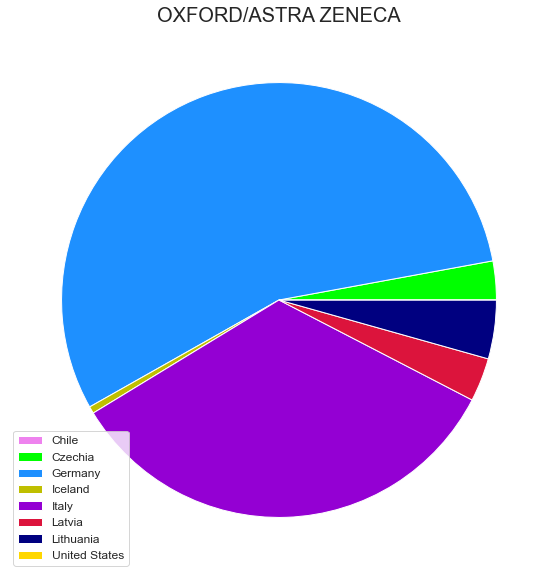

In [112]:
sns.set_style("whitegrid")
clr = ['violet','lime','dodgerblue','y','darkviolet','crimson','navy','gold']
plt.figure(figsize = (10,10))
plt.title('OXFORD/ASTRA ZENECA', size = 20)
plt.pie(df82['Oxford/AstraZeneca'], colors = clr)
plt.legend(labels = df82[0], loc = 3, prop = {'size': 12})

#### Lithuania is the highest consumer of Oxford/Astra Zenaca vaccine

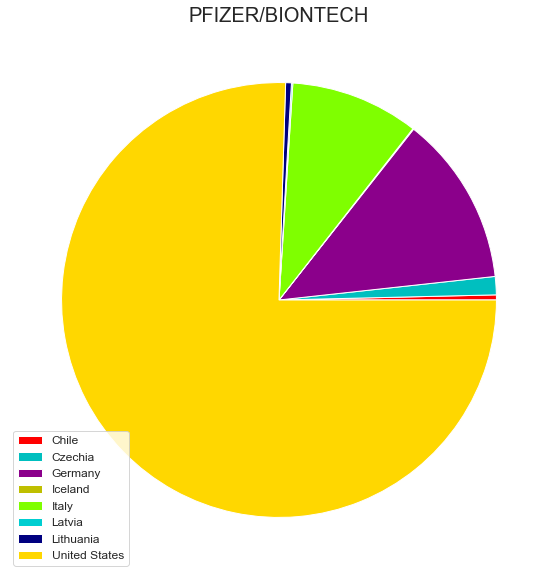

In [113]:
sns.set_style("whitegrid")
clrs = ['r','c','darkmagenta','y','chartreuse','darkturquoise','navy','gold']
plt.figure(figsize = (10,10))
plt.title('PFIZER/BIONTECH', size = 20)
plt.pie(df82['Pfizer/BioNTech'], colors = clrs)
plt.legend(labels = df82[0], loc = 3, prop = {'size': 12})

#### United States of America is the highest consumer of Pfizer vaccine

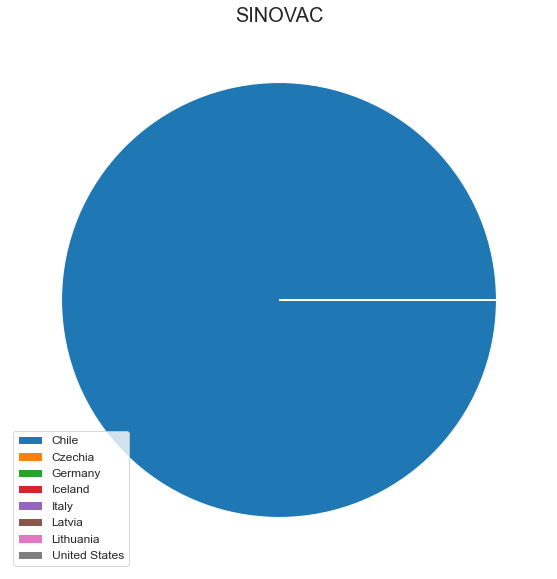

In [115]:
sns.set_style("whitegrid")
plt.figure(figsize = (10,10))
plt.title('SINOVAC', size = 20)
plt.pie(df82['Sinovac'])
plt.legend(labels = df82[0], loc = 3, prop = {'size': 12})

#### Chile is the only country that has used Sinovac

Text(0, 0.5, 'Number of Vaccines')

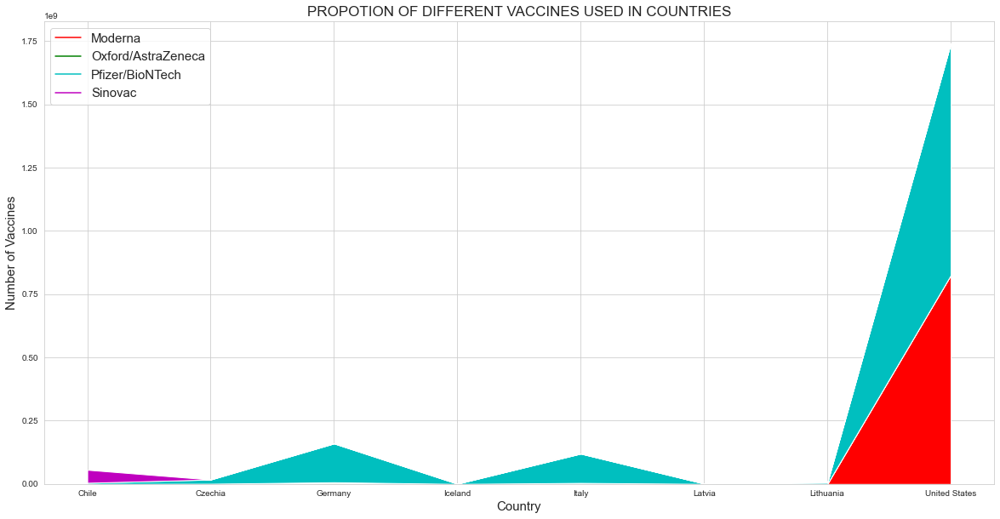

In [119]:
sns.set_style("whitegrid")
plt.figure(figsize = (20,10))
plt.plot([], [], color ='r',  
         label ='Moderna') 
plt.plot([], [], color ='g', 
         label ='Oxford/AstraZeneca') 
plt.plot([], [], color ='c', 
         label ='Pfizer/BioNTech') 
plt.plot([], [], color ='m', 
         label ='Sinovac') 
plt.stackplot(vaccinefil, moderna, Oxford_AstraZeneca,Pfizer_BioNTech, Sinovac,colors = ['r','g','c','m'])
plt.legend(loc = 2 , prop = {'size': 15})
plt.title('PROPOTION OF DIFFERENT VACCINES USED IN COUNTRIES', size = 17) 
plt.xlabel('Country', size = 15) 
plt.ylabel('Number of Vaccines', size = 15) 

#### Pfizer seems to be the most preferred vaccine followed by Moderna according to the plot

---

### COVID-19 Vaccination in India

In [83]:
vac = pd.read_csv('/Users/test/Desktop/Project/country_vaccinations.csv')

In [84]:
i = vac.groupby('country')

In [85]:
India = pd.DataFrame(i.get_group('India'))

In [86]:
India.drop(columns = ['iso_code', 'people_fully_vaccinated', 'daily_vaccinations_raw', 'people_fully_vaccinated_per_hundred', 'source_name', 'source_website'], inplace = True)

In [87]:
India.dropna(inplace = True)

In [88]:
India['date'] = pd.to_datetime(India['date'] , format = '%Y-%m-%d')

In [89]:
India.set_index('date', inplace = True)

In [90]:
India1 = India.reset_index()

In [91]:
India1['day'] = India1['date'].dt.day_name()

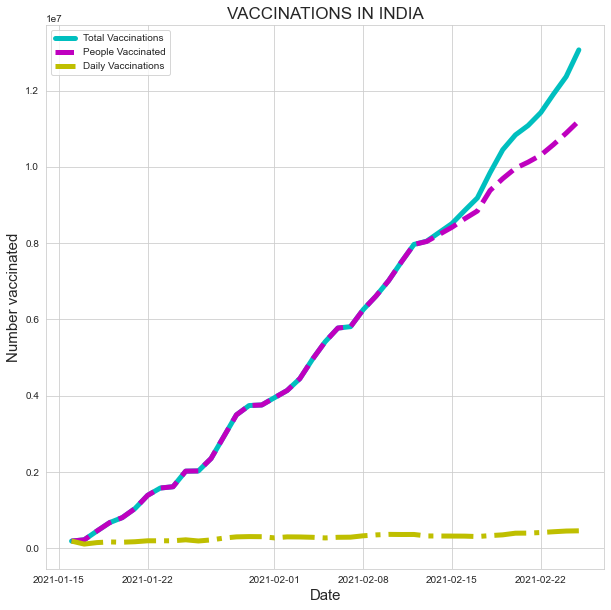

In [123]:
sns.set_style("whitegrid")
plt.figure(figsize = (10,10))

plt.plot_date(India1['date'],India1['total_vaccinations'],'c', label = 'Total Vaccinations', linestyle = 'solid', linewidth = 5)
plt.plot_date(India1['date'],India1['people_vaccinated'],'m', label = 'People Vaccinated', linestyle = '--', linewidth = 5)
plt.plot_date(India1['date'],India1['daily_vaccinations'],'y', label = 'Daily Vaccinations', linestyle = '-.', linewidth = 5)

plt.title('VACCINATIONS IN INDIA', size = 17)
plt.xlabel('Date', size = 15)
plt.ylabel('Number vaccinated', size = 15)
plt.legend()

#### Number of people being vaccinated has been increasing while the number of vaccines being administered daily has remained constant

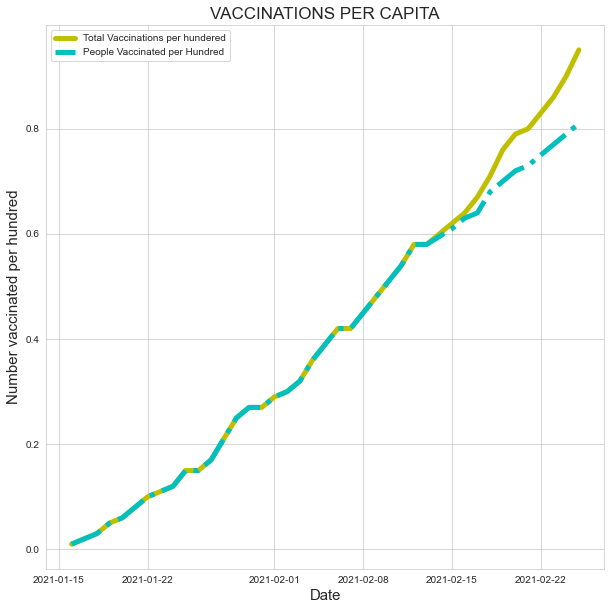

In [124]:
sns.set_style("whitegrid")
plt.figure(figsize = (10,10))
plt.plot_date(India1['date'],India1['total_vaccinations_per_hundred'],'y',label = 'Total Vaccinations per hundered', linestyle = 'solid', linewidth = 5)
plt.plot_date(India1['date'],India1['people_vaccinated_per_hundred'],'c', label = 'People Vaccinated per Hundred', linestyle = '-.', linewidth = 5)

plt.title('VACCINATIONS PER CAPITA', size = 17)
plt.xlabel('Date', size = 15)
plt.ylabel('Number vaccinated per hundred', size = 15)
plt.legend()

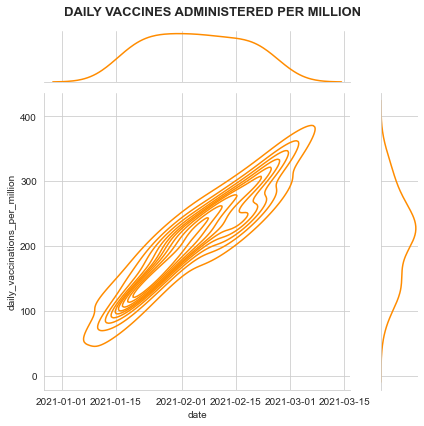

In [126]:
p = sns.jointplot(data = India1, x = "date", y = "daily_vaccinations_per_million", color = "darkorange", kind = "kde")
p.fig.suptitle("DAILY VACCINES ADMINISTERED PER MILLION", size = 13, fontweight = "bold")
p.fig.tight_layout()

The number of vaccines administered daily per million is plotted against the date

#### Number of people being vaccinated have been increasing continuously. During the month of February the number of vaccines administered have approximately been constant, this is shown by the high density at the centre of the graph.

---

---